#### Install GYM

In [48]:
!pip install gymnasium[classic-control]

#### Imports

In [49]:
import gymnasium as gym
import numpy as np
import random

import imageio
import os
from IPython.display import Image

#### Test environment

In [50]:
# Créer/initialiser l'environnement Taxi-v3
env = gym.make("Taxi-v3", render_mode="rgb_array") 
# "ansi" permet d’afficher l’état du jeu sous forme de texte / autre option : render_mode="rgb_array"

state_space = env.observation_space.n
print("There are ", state_space, " possible states")

There are  500  possible states


In [51]:
action_space = env.action_space.n
print("There are ", action_space, " possible actions")

There are  6  possible actions


In [52]:
def initialize_q_table(state_space, action_space):
    Qtable = np.zeros((state_space, action_space))
    return Qtable

In [53]:
Qtable_taxi = initialize_q_table(state_space, action_space)
print(Qtable_taxi)
print("Q-table shape: ", Qtable_taxi.shape)

[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
Q-table shape:  (500, 6)


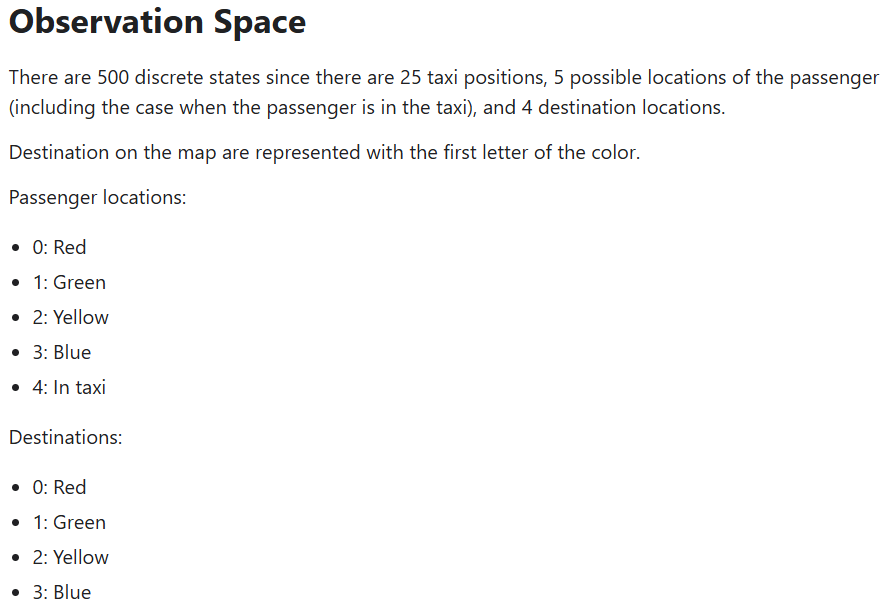

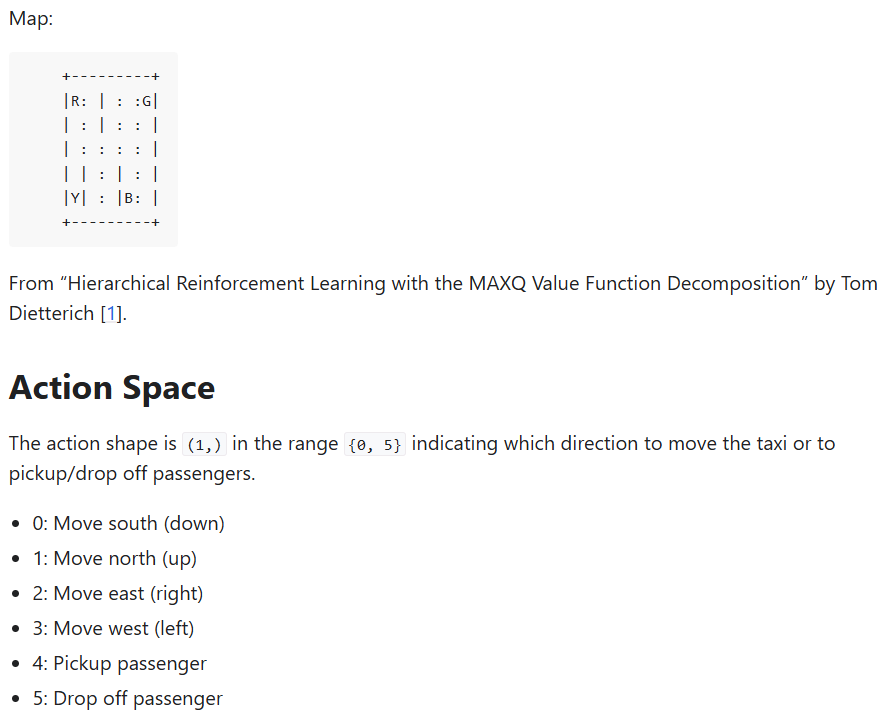

#### Rewards

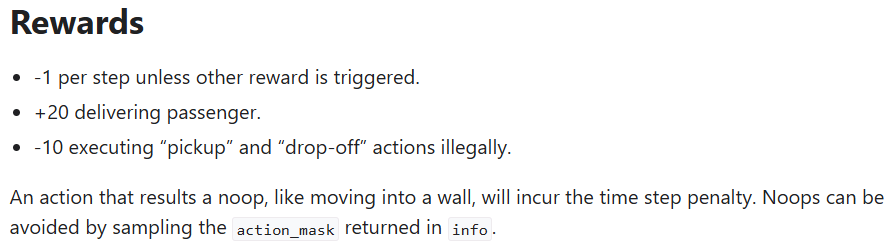

#### Tester l’agent aléatoire

In [54]:
# Réinitialiser l'environnement
state, info = env.reset()
done = False

# Boucle pour exécuter un épisode complet avec un agent aléatoire
for _ in range(40):  # Exécuter 20 actions (modifiable)
    action = env.action_space.sample()  # Choisir une action/l'agent exécute des actions aléatoire
    next_state, reward, done, truncated, info = env.step(action)  # Appliquer l'action

    print(env.render())  # Afficher l'environnement
    print(f"Action: {action}, Reward: {reward}, Done: {done}")

    if done:
        break  # Fin de l'épisode si le passager a été déposé

env.close()

[[[110 109 106]
  [110 109 106]
  [124 122 122]
  ...
  [108 111 109]
  [108 111 109]
  [118 119 119]]

 [[110 109 106]
  [110 109 106]
  [124 122 122]
  ...
  [108 111 109]
  [108 111 109]
  [118 119 119]]

 [[114 116 115]
  [114 116 115]
  [126 127 126]
  ...
  [112 113 111]
  [112 113 111]
  [118 117 115]]

 ...

 [[116 115 116]
  [116 115 116]
  [106 107 108]
  ...
  [113 115 114]
  [113 115 114]
  [117 114 117]]

 [[116 115 116]
  [116 115 116]
  [106 107 108]
  ...
  [113 115 114]
  [113 115 114]
  [117 114 117]]

 [[115 112 112]
  [115 112 112]
  [119 119 117]
  ...
  [123 119 118]
  [123 119 118]
  [114 114 117]]]
Action: 3, Reward: -1, Done: False
[[[110 109 106]
  [110 109 106]
  [124 122 122]
  ...
  [108 111 109]
  [108 111 109]
  [118 119 119]]

 [[110 109 106]
  [110 109 106]
  [124 122 122]
  ...
  [108 111 109]
  [108 111 109]
  [118 119 119]]

 [[114 116 115]
  [114 116 115]
  [126 127 126]
  ...
  [112 113 111]
  [112 113 111]
  [118 117 115]]

 ...

 [[116 115 116]
 

In [ ]:
num_episodes = 10  # Nombre d’épisodes à exécuter
total_rewards = []  # Stocker les rewards des épisodes
steps_per_episode = []  # Stocker le nombre d'étapes

for episode in range(num_episodes):
    state, info = env.reset()
    done = False
    total_reward = 0  # Cumul des récompenses
    steps = 0  # Nombre d'actions effectuées

    while not done:
        action = env.action_space.sample()  # Action aléatoire
        next_state, reward, done, truncated, info = env.step(action)  # Appliquer l'action
        
        total_reward += reward
        steps += 1

        if done:
            break

    total_rewards.append(total_reward)
    steps_per_episode.append(steps)

    print(f"Épisode {episode + 1}: Reward total = {total_reward}, Nombre d'étapes = {steps}")

env.close()

# Calcul des statistiques
avg_reward = sum(total_rewards) / num_episodes
avg_steps = sum(steps_per_episode) / num_episodes

print("\n🔎 **Évaluation de l'agent aléatoire** 🔎")
print(f"🎯 Moyenne des récompenses : {avg_reward:.2f}")
print(f"🚶‍♂️ Moyenne des étapes : {avg_steps:.2f}")

Épisode 1: Reward total = -9872, Nombre d'étapes = 2558
Épisode 2: Reward total = -1776, Nombre d'étapes = 492
Épisode 3: Reward total = -11043, Nombre d'étapes = 2865
Épisode 4: Reward total = -3546, Nombre d'étapes = 903
Épisode 5: Reward total = -6058, Nombre d'étapes = 1570
Épisode 6: Reward total = -2718, Nombre d'étapes = 696
Épisode 7: Reward total = -11323, Nombre d'étapes = 2875
Épisode 8: Reward total = -5008, Nombre d'étapes = 1375
Épisode 9: Reward total = -13737, Nombre d'étapes = 3570
Épisode 10: Reward total = -16576, Nombre d'étapes = 4303

🔎 **Évaluation de l'agent aléatoire** 🔎
🎯 Moyenne des récompenses : -8165.70
🚶‍♂️ Moyenne des étapes : 2120.70


##### Conclusions

L'agent aléatoire est très mauvais. Déjà car il ne suit aucune stratégie, il choisit des actions totalement au hasard, ce qui inclut des mouvements inutiles et des actions invalides. Mais aussi car les pénalités sont élevées (et la récompense pas très élevée, il gagne seulement +20 points s’il réussit).

On voit aussi que si on augmente le nombre d'épisodes (jusqu'à 100 par exemple), il ne s'améliore pas (pour 100 épisodes j'ai 2600 étapes en moyenne).

Cela confirme que l’approche aléatoire est inefficace, ce qui justifie l’utilisation d’un algorithme de Reinforcement Learning comme Q-Learning ou Deep Q-Learning (DQN).

#### Video

In [56]:
def record_random_agent_video(env, video_path, num_episodes=1):
    images = []
    for episode in range(num_episodes):
        state, info = env.reset()
        done = False
        img = env.render()
        images.append(img)
        while not done:
            action = env.action_space.sample()  # Action aléatoire
            state, reward, done, truncated, info = env.step(action)
            img = env.render()
            images.append(img)
    imageio.mimsave(video_path, images)

après video_path
après record_random_agent_video


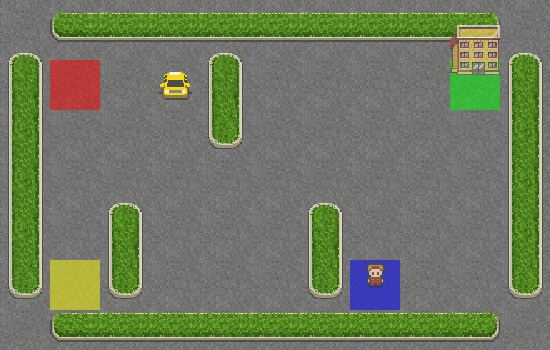

In [57]:
# Définir le répertoire de sortie pour la vidéo
output_dir = "videos"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Enregistrer la vidéo
video_path = os.path.join(output_dir, "random_agent.gif")
print("après video_path")

record_random_agent_video(env, video_path, num_episodes=1)
print("après record_random_agent_video")

# Afficher la vidéo dans le notebook
Image(video_path)